In [169]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA

## 数据读取

In [2]:
def read_and_classify_txt_files(folder_path,header):
    # 获取文件夹中的所有文件
    files = os.listdir(folder_path)
    df_data = pd.DataFrame([], columns=header)
    df_compare = pd.DataFrame([], columns=header) 
    # 遍历文件夹中的每个文件
    for file_name in files:
        # 检查文件是否是txt文件
        if file_name.endswith(".txt"):    
            # 构建完整的文件路径
            file_path = os.path.join(folder_path, file_name)
            temp = file_name.split(" ")
            data = pd.read_csv(file_path, sep='\t', header=None, names=['Wavelength', 'Value'])
            hour=float(temp[-1][:-4])
            date = temp[-3]
            sample = folder_path[-1]
            values = list(data['Value'])
            values=[hour,date,sample]+values
            if '对照组' in file_name:
                df_compare.loc[len(df_compare)] = values
            else:
                df_data.loc[len(df_data)] = values
    return df_data,df_compare

In [3]:
folder_path_a = r"./data/a"
folder_path_b = r"./data/b"
file_path = r"./data/a/01 第一天实验1 01.06 下午四点半 0.txt"
df = pd.read_csv(file_path, sep='\t', header=None, names=['Wavelength', 'Value'])
waveheader = list(df['Wavelength'])
header=['storage hour','date','sample']+waveheader
data_a,compare_a = read_and_classify_txt_files(folder_path_a,header)
data_b,compare_b = read_and_classify_txt_files(folder_path_b,header)

In [4]:
data_a

,storage hour,date,sample,367.62,367.82,368.02,368.23,368.43,368.63,368.83,...,1059.63,1059.81,1059.99,1060.16,1060.34,1060.52,1060.69,1060.87,1061.04,1061.22
0,0.0,01.06,a,23.0,67.0,103.0,62.0,96.0,40.0,0.0,...,178.0,209.0,144.0,147.0,112.0,215.0,191.0,232.0,201.0,222.0
1,0.0,01.06,a,31.0,46.0,32.0,90.0,48.0,-8.0,19.0,...,203.0,202.0,168.0,224.0,186.0,251.0,217.0,260.0,226.0,259.0
2,0.0,01.06,a,8.0,68.0,77.0,77.0,92.0,30.0,-6.0,...,171.0,209.0,199.0,235.0,181.0,239.0,187.0,245.0,249.0,211.0
3,0.0,01.06,a,-28.0,26.0,72.0,52.0,97.0,30.0,19.0,...,214.0,227.0,172.0,217.0,195.0,231.0,208.0,248.0,216.0,240.0
4,0.0,01.06,a,25.0,127.0,87.0,50.0,56.0,13.0,26.0,...,203.0,234.0,173.0,192.0,116.0,211.0,225.0,236.0,204.0,238.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,38.5,01.08,a,10.0,24.0,42.0,-6.0,7.0,41.0,14.0,...,150.0,112.0,97.0,106.0,82.0,55.0,50.0,133.0,127.0,61.0
77,38.5,01.08,a,36.0,19.0,106.0,92.0,17.0,-4.0,-19.0,...,170.0,43.0,32.0,115.0,121.0,83.0,79.0,102.0,61.0,79.0
78,38.5,01.08,a,3.0,-4.0,65.0,63.0,38.0,8.0,76.0,...,186.0,89.0,65.0,96.0,126.0,129.0,88.0,123.0,100.0,115.0
79,38.5,01.08,a,-2.0,29.0,51.0,31.0,-14.0,-37.0,50.0,...,161.0,69.0,102.0,156.0,118.0,149.0,96.0,147.0,144.0,125.0


In [5]:
data_b

,storage hour,date,sample,367.62,367.82,368.02,368.23,368.43,368.63,368.83,...,1059.63,1059.81,1059.99,1060.16,1060.34,1060.52,1060.69,1060.87,1061.04,1061.22
0,0.0,01.09,b,-47.0,0.0,14.0,-81.0,-84.0,-32.0,-46.0,...,118.0,71.0,32.0,95.0,82.0,85.0,70.0,56.0,39.0,-1.0
1,0.0,01.09,b,-60.0,-49.0,-42.0,-79.0,-81.0,-56.0,-88.0,...,134.0,24.0,26.0,103.0,121.0,81.0,54.0,91.0,109.0,55.0
2,0.0,01.09,b,-86.0,-3.0,0.0,-83.0,6.0,23.0,-13.0,...,87.0,19.0,20.0,104.0,104.0,89.0,84.0,114.0,32.0,-28.0
3,0.0,01.09,b,-12.0,39.0,-25.0,-98.0,-31.0,-28.0,-56.0,...,115.0,38.0,19.0,75.0,116.0,113.0,135.0,156.0,127.0,22.0
4,0.0,01.09,b,-12.0,3.0,-36.0,-80.0,-3.0,6.0,-8.0,...,103.0,60.0,113.0,132.0,143.0,157.0,76.0,79.0,78.0,-4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,49.0,01.11,b,8.0,-25.0,-14.0,63.0,64.0,36.0,-2.0,...,46.0,18.0,103.0,28.0,30.0,61.0,31.0,33.0,14.0,45.0
140,49.0,01.11,b,0.0,-29.0,-6.0,6.0,33.0,2.0,36.0,...,145.0,98.0,144.0,64.0,44.0,74.0,63.0,80.0,40.0,14.0
141,49.0,01.11,b,16.0,-1.0,-9.0,36.0,39.0,72.0,46.0,...,71.0,40.0,82.0,-24.0,45.0,83.0,60.0,61.0,36.0,32.0
142,49.0,01.11,b,26.0,17.0,4.0,64.0,31.0,11.0,37.0,...,53.0,37.0,83.0,39.0,29.0,62.0,91.0,47.0,56.0,38.0


In [6]:
compare_a

,storage hour,date,sample,367.62,367.82,368.02,368.23,368.43,368.63,368.83,...,1059.63,1059.81,1059.99,1060.16,1060.34,1060.52,1060.69,1060.87,1061.04,1061.22
0,0.0,01.06,a,239.0,246.0,243.0,250.0,279.0,216.0,225.0,...,1008.0,1005.0,996.0,1050.0,939.0,976.0,985.0,1010.0,1057.0,1036.0
1,18.5,01.07,a,322.0,273.0,259.0,338.0,362.0,329.0,343.0,...,1044.0,1099.0,1054.0,1037.0,1092.0,990.0,955.0,1009.0,972.0,978.0
2,23.0,01.07,a,151.0,212.0,218.0,143.0,220.0,215.0,266.0,...,1099.0,1099.0,969.0,932.0,1055.0,1041.0,983.0,954.0,940.0,1044.0
3,26.0,01.07,a,373.0,336.0,406.0,442.0,430.0,445.0,382.0,...,1194.0,1100.0,1160.0,1250.0,1180.0,1165.0,1170.0,1196.0,1181.0,1108.0
4,30.0,01.08,a,375.0,342.0,351.0,379.0,344.0,310.0,257.0,...,1074.0,1089.0,1090.0,1087.0,1147.0,1033.0,1039.0,1029.0,1011.0,1051.0
5,32.0,01.08,a,305.0,267.0,239.0,297.0,297.0,233.0,238.0,...,1090.0,1108.0,1115.0,1067.0,1005.0,1011.0,966.0,1059.0,1020.0,941.0
6,34.5,01.08,a,295.0,380.0,277.0,281.0,309.0,327.0,304.0,...,1147.0,1015.0,1040.0,1043.0,1031.0,1138.0,1084.0,1082.0,1066.0,1104.0
7,36.5,01.08,a,314.0,342.0,302.0,350.0,321.0,321.0,299.0,...,1088.0,1080.0,1036.0,1040.0,1058.0,1070.0,1004.0,974.0,1010.0,1067.0
8,38.5,01.08,a,338.0,271.0,330.0,343.0,335.0,323.0,361.0,...,1095.0,1009.0,1026.0,1133.0,1098.0,1106.0,1040.0,985.0,1012.0,985.0


In [7]:
compare_b

,storage hour,date,sample,367.62,367.82,368.02,368.23,368.43,368.63,368.83,...,1059.63,1059.81,1059.99,1060.16,1060.34,1060.52,1060.69,1060.87,1061.04,1061.22
0,0.0,01.09,b,287.0,271.0,220.0,214.0,274.0,321.0,292.0,...,981.0,940.0,921.0,982.0,975.0,976.0,978.0,939.0,921.0,850.0
1,2.0,01.09,b,222.0,222.0,243.0,229.0,269.0,309.0,249.0,...,901.0,934.0,949.0,941.0,973.0,925.0,913.0,938.0,875.0,863.0
2,4.0,01.09,b,331.0,324.0,345.0,349.0,326.0,308.0,270.0,...,1155.0,1138.0,1151.0,1083.0,1112.0,1023.0,1035.0,978.0,990.0,980.0
3,6.0,01.09,b,312.0,325.0,317.0,340.0,269.0,292.0,324.0,...,1061.0,1035.0,1060.0,1125.0,1070.0,1013.0,1022.0,986.0,936.0,931.0
4,8.0,01.09,b,293.0,324.0,305.0,298.0,364.0,266.0,292.0,...,1052.0,977.0,944.0,995.0,1014.0,944.0,943.0,986.0,1006.0,1005.0
5,10.0,01.09,b,310.0,351.0,425.0,385.0,419.0,367.0,387.0,...,955.0,989.0,985.0,942.0,952.0,970.0,989.0,1027.0,1043.0,960.0
6,23.0,01.10,b,372.0,367.0,344.0,356.0,350.0,326.0,327.0,...,1095.0,1027.0,996.0,935.0,897.0,958.0,957.0,956.0,975.0,1001.0
7,25.0,01.10,b,350.0,376.0,377.0,405.0,381.0,369.0,370.0,...,1029.0,1044.0,1018.0,977.0,995.0,924.0,958.0,933.0,962.0,923.0
8,28.0,01.10,b,184.0,225.0,226.0,181.0,227.0,270.0,286.0,...,918.0,922.0,914.0,855.0,846.0,941.0,961.0,957.0,874.0,827.0
9,29.0,01.10,b,456.0,387.0,383.0,415.0,413.0,408.0,339.0,...,1069.0,1026.0,1095.0,1133.0,1094.0,1061.0,1067.0,1055.0,1072.0,1047.0


## 数据处理
初步处理：将对应实验组数据除以对照组数据

In [111]:
def data_process(data,compare):
    # 将对应实验组数据除以对照组数据
    data_processed = []
    for i in range(len(data)):
        newdata = np.array([])
        hour = float(data.loc[i, 'storage hour'])
        date = data.loc[i, 'date']
        sample = data.loc[i, 'sample']
        wavedata = np.array(data.iloc[i,3:])
        # 查找对应的对照组数据
        comparedata = compare[compare['storage hour'] == hour]  # 选择满足条件的行
        comparewavedata = np.array(comparedata.iloc[0,3:])
        newdata = wavedata / comparewavedata
        newdata = np.append([hour],newdata)
        newdata = np.append([sample],newdata)
        data_processed.append(newdata)
    data_processed = np.array(data_processed)
    return data_processed

两次实验的数据，处理后单独展示。

In [112]:
data_processed_a = data_process(data_a,compare_a)
data_processed_a

array([['a', 0.0, 0.09623430962343096, ..., 0.2297029702970297,
        0.1901608325449385, 0.21428571428571427],
       ['a', 0.0, 0.1297071129707113, ..., 0.25742574257425743,
        0.21381267738883633, 0.25],
       ['a', 0.0, 0.03347280334728033, ..., 0.24257425742574257,
        0.23557237464522232, 0.20366795366795368],
       ...,
       ['a', 38.5, 0.008875739644970414, ..., 0.12487309644670051,
        0.09881422924901186, 0.116751269035533],
       ['a', 38.5, -0.005917159763313609, ..., 0.14923857868020304,
        0.1422924901185771, 0.12690355329949238],
       ['a', 38.5, -0.029585798816568046, ..., 0.06598984771573604,
        0.10573122529644269, 0.10050761421319797]], dtype=object)

In [113]:
data_processed_b = data_process(data_b,compare_b)
data_processed_b

array([['b', 0.0, -0.16376306620209058, ..., 0.059637912673056445,
        0.04234527687296417, -0.001176470588235294],
       ['b', 0.0, -0.20905923344947736, ..., 0.09691160809371673,
        0.11834961997828447, 0.06470588235294118],
       ['b', 0.0, -0.29965156794425085, ..., 0.12140575079872204,
        0.03474484256243214, -0.03294117647058824],
       ...,
       ['b', 49.0, 0.0469208211143695, ..., 0.06230847803881512,
        0.03761755485893417, 0.033264033264033266],
       ['b', 49.0, 0.07624633431085044, ..., 0.04800817160367722,
        0.05851619644723093, 0.0395010395010395],
       ['b', 49.0, -0.020527859237536656, ..., 0.009193054136874362,
        0.030303030303030304, 0.06340956340956341]], dtype=object)

两次实验合并后的数据，共225条。

In [114]:
newdata = np.vstack((data_processed_a,data_processed_b))
newdata

array([['a', 0.0, 0.09623430962343096, ..., 0.2297029702970297,
        0.1901608325449385, 0.21428571428571427],
       ['a', 0.0, 0.1297071129707113, ..., 0.25742574257425743,
        0.21381267738883633, 0.25],
       ['a', 0.0, 0.03347280334728033, ..., 0.24257425742574257,
        0.23557237464522232, 0.20366795366795368],
       ...,
       ['b', 49.0, 0.0469208211143695, ..., 0.06230847803881512,
        0.03761755485893417, 0.033264033264033266],
       ['b', 49.0, 0.07624633431085044, ..., 0.04800817160367722,
        0.05851619644723093, 0.0395010395010395],
       ['b', 49.0, -0.020527859237536656, ..., 0.009193054136874362,
        0.030303030303030304, 0.06340956340956341]], dtype=object)

In [115]:
newdata.shape

(225, 3650)

数据展示。

In [48]:
# 绘制所有数据的曲线图
x = waveheader
plt.figure(figsize=(100, 100))
for num in range(newdata.shape[0]):
    y = newdata[num][2:]
    plt.plot(x, y, label="sample "+newdata[num][0]+" after "+newdata[num][1]+"hours")
plt.legend()
plt.title('all data')
plt.xlabel('wavelength')
plt.ylabel('value')
plt.savefig('all data.png')
plt.show()

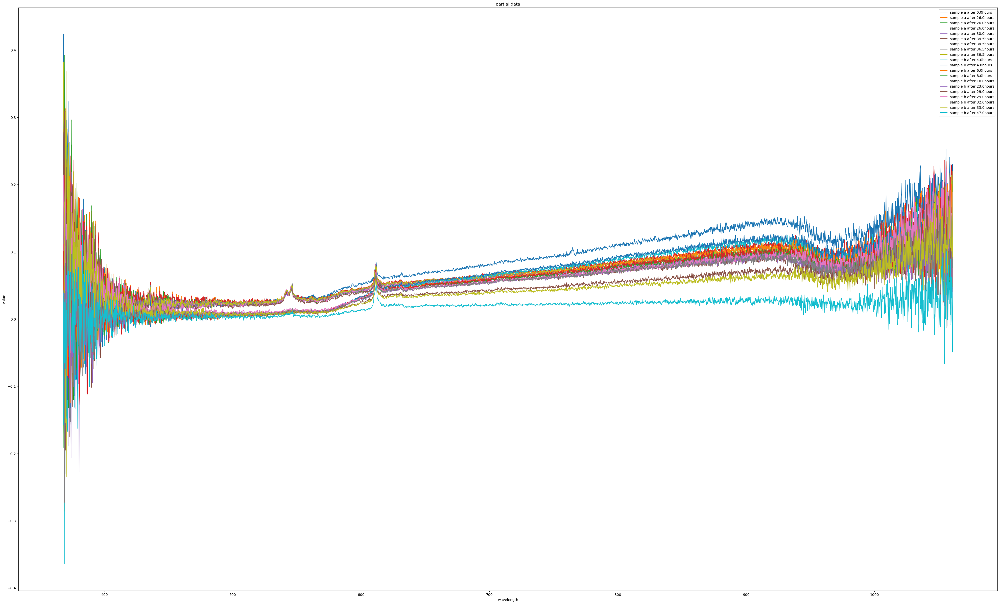

In [50]:
# 随机挑选部分数据绘制曲线图
x = waveheader
random_numbers = random.sample(range(0, 226), 20)
random_numbers.sort()
plt.figure(figsize=(50, 30))
for num in random_numbers:
    y = newdata[num][2:]
    plt.plot(x, y, label="sample "+newdata[num][0]+" after "+newdata[num][1]+"hours")
plt.legend()
plt.title('partial data')
plt.xlabel('wavelength')
plt.ylabel('value')
plt.savefig('partial data.png')
plt.show()

选取哪类数据作为最终的处理数据。

In [295]:
X = newdata[:,2:]
y = newdata[:,1]

# X = data_processed_b[:,2:]
# y = data_processed_b[:,1]

# X = data_processed_a[:,2:]
# y = data_processed_a[:,1]

PCA降维。

In [296]:
n_components = 100
pca = PCA(n_components=n_components)
X = pca.fit_transform(X)

## 模型训练
训练线性回归模型并预测测试集，评估各项指标。

In [297]:
# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 初始化线性回归模型
model = LinearRegression()

# 训练模型
model.fit(X_train, y_train)
print('回归系数:', model.coef_)

# 在测试集上进行预测
y_pred = model.predict(X_test)

# 评估模型性能
score = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print("r2_score:", score)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

回归系数: [  1.8615577   11.87736732  24.17346676   7.44180444   1.9493291
   3.4857197    5.8444068   -2.79609792   5.91812491  -1.80781901
  -6.24783994   2.59040269  -0.4421139   -1.77939003   8.73779292
  14.79632404  -0.09647462   3.48435833   1.82409753  -2.72496606
   0.12577869  -9.04056711  -2.42140062   1.05232568   0.70778352
   4.36775813   8.0531245   -5.77401137   2.30027618  -0.71239293
  12.41125879 -17.41538216   5.09451272   5.32180142  18.64420199
   2.25026193  -8.60766057  -4.45668065   2.38788034   1.35185752
   8.21156971  -9.42682293   2.74102547  -1.18794442  -2.06878004
  19.04789553  -5.44747381   8.74032955   5.17693131   2.09653642
 -10.96367088  -8.76122408   6.136489     8.32182301  -5.1069573
   9.18346911  -0.8128047   17.03342128  -1.71733843   5.09195082
  14.6497036   -1.0619964    6.08983462   4.24788931  -1.0720984
 -10.9360858   -1.47494329   0.80341585  -9.79293154  -7.70196482
  -1.32031549  17.79206026  15.65206357  -9.06446015  -6.48701466
  -6.21

查看模型预测的储存时间。

In [298]:
y_pred

array([17.8104342 , 30.20890249,  6.29696505, 41.69856373, 26.39897831,
       40.7015843 , 29.02296628, -0.32629738, 30.9563797 , 31.16890821,
       39.91068341, 21.11029038, 26.91140781, 26.17962898, 30.69152827,
       34.64206807, 32.39982807, 33.84982951,  7.82869425, 30.76486053,
       40.71071093, 20.37636547, 35.75358259, 28.98125242,  7.37240922,
        5.65273565, 36.08012677, 27.41735329, 49.78605967,  5.36771189,
       12.12896237, 38.41954881, 13.33642988, 31.86428815, 28.16031015,
       10.58297975, 29.65539358,  6.98100426,  9.16029083, 24.64837015,
       20.15170523, 53.69310012, 16.28588037, 46.02859491, 19.52104719])

查看实际的储存时间，进行对比。

In [299]:
y_test

array([18.5, 32.0, 8.0, 47.0, 25.0, 47.0, 32.0, 0.0, 30.0, 30.0, 36.5,
       18.5, 34.0, 23.0, 26.0, 32.0, 34.5, 30.0, 4.0, 29.0, 38.5, 23.0,
       29.0, 25.0, 2.0, 0.0, 33.0, 30.0, 49.0, 4.0, 8.0, 38.5, 18.5, 34.0,
       34.0, 8.0, 33.0, 6.0, 6.0, 25.0, 23.0, 47.0, 23.0, 49.0, 23.0],
      dtype=object)

绘制散点图，更清晰地对比预测值和实际值。

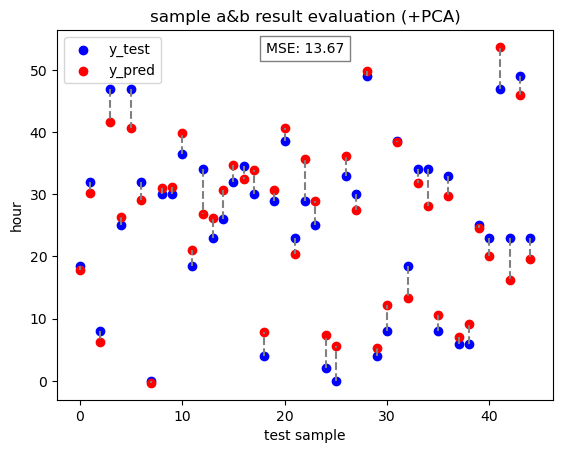

In [300]:
x = list(range(y_test.shape[0]))
plt.scatter(x, y_test, color='blue', marker='o', label='y_test')
plt.scatter(x, y_pred, color='red', marker='o', label='y_pred')
plt.legend()
plt.text(0.5, 0.95, f"MSE: {mse:.2f}", ha='center', va='center', transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5))

# 连接相同x值的两个点
for i in range(len(x)):
    plt.plot([x[i], x[i]], [y_test[i], y_pred[i]], color='gray', linestyle='--')
plt.title(r'sample a&b result evaluation (+PCA)')
plt.xlabel('test sample')
plt.ylabel('hour')
plt.savefig(r'sample a&b result evaluation (+PCA).png')
plt.show()

In [301]:
# import os

# directory = r"./data/a"

# # 获取文件夹内所有文件的名称
# files = os.listdir(directory)

# # 遍历文件夹内的所有文件
# for file in files:
#     #print(file)
#     if file[0]!='0':
#         if (file[0]!='1') or (file[0]=='1' and file[1]==' '):
#             # 构建新的文件名，添加"0"到文件名开头
#             new_name = "0" + file
#             # 重命名文件
#             os.rename(os.path.join(directory, file), os.path.join(directory, new_name))
